In [8]:
# Name: Arpan Purkait
# Date: Tue 10 Apr, 2025
# ISI Kolkata - Internship
import pandas as pd

In [9]:
df = pd.read_csv('GWB1223.csv')
print(df.head())

         Date  Latitude  Longitude   Tmax   Tmin  Rain
0  2012-01-01      21.5       85.5  28.45  17.24   0.0
1  2012-01-02      21.5       85.5  27.20  17.68   0.0
2  2012-01-03      21.5       85.5  27.56  17.51   0.0
3  2012-01-04      21.5       85.5  25.63  17.69   0.0
4  2012-01-05      21.5       85.5  27.87  18.00   0.0


In [10]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df['Tmean'] = (df['Tmax'] + df['Tmin']) / 2

In [11]:
# computing the average for each day-of-year across all 11 years
# Climetological daily Normal

In [12]:
# Group by Date to get daily mean across all lat-long grids
daily_mean_temp = df.copy()
print(daily_mean_temp.head())
daily_mean_temp.to_csv('daily_mean_temperature.csv', index=False)

        Date  Latitude  Longitude   Tmax   Tmin  Rain   Tmean
0 2012-01-01      21.5       85.5  28.45  17.24   0.0  22.845
1 2012-01-02      21.5       85.5  27.20  17.68   0.0  22.440
2 2012-01-03      21.5       85.5  27.56  17.51   0.0  22.535
3 2012-01-04      21.5       85.5  25.63  17.69   0.0  21.660
4 2012-01-05      21.5       85.5  27.87  18.00   0.0  22.935


In [13]:
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
grid_avg_tmean = df.groupby(['Latitude', 'Longitude','Month', 'Day'])['Tmean'].mean().reset_index()
grid_avg_tmean.rename(columns={'Tmean': 'Tmean_11yr_avg'}, inplace=True)
grid_avg_tmean = grid_avg_tmean.sort_values(by='Latitude', ascending=False)
print(grid_avg_tmean.head())
grid_avg_tmean.to_csv('grid_11_year_avg_tmean.csv', index=False)

      Latitude  Longitude  Month  Day  Tmean_11yr_avg
7271      25.5       88.5     11   13       23.522033
7283      25.5       88.5     11   25       21.395863
7319      25.5       88.5     12   31       17.392521
7318      25.5       88.5     12   30       17.151325
7317      25.5       88.5     12   29       16.571667


In [14]:
import matplotlib.pyplot as plt

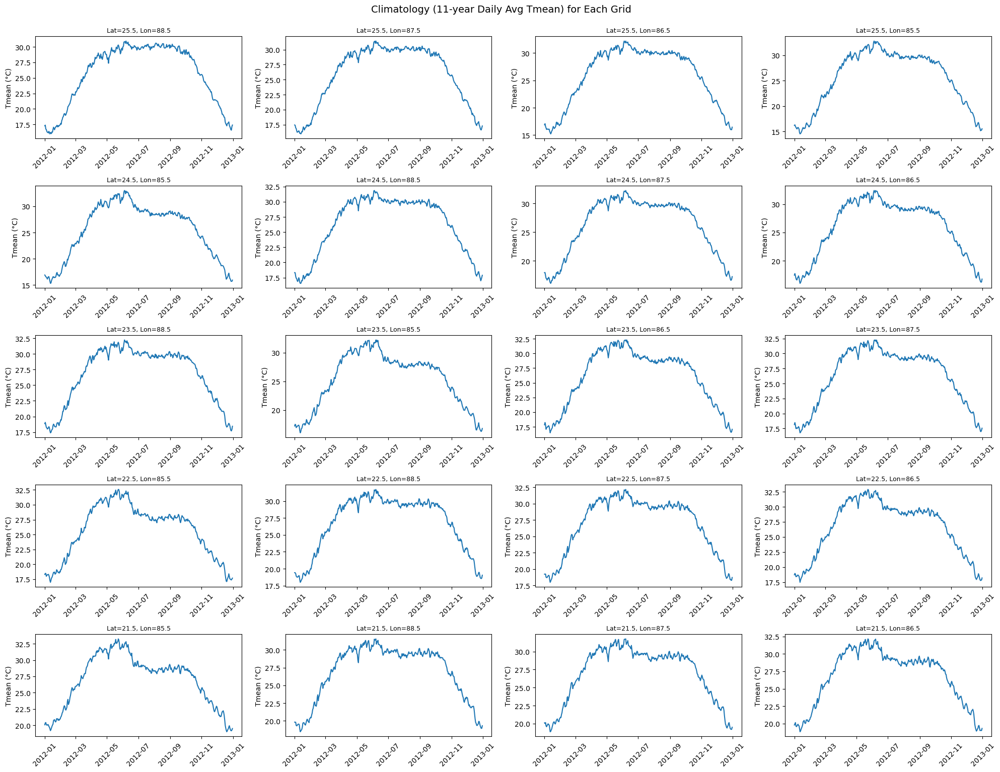

In [15]:
grid_avg_tmean['Date'] = pd.to_datetime(
    '2012-' + grid_avg_tmean['Month'].astype(str).str.zfill(2) + '-' + grid_avg_tmean['Day'].astype(str).str.zfill(2),
    errors='coerce'  # invalid dates will become NaT
)
grid_points = grid_avg_tmean[['Latitude', 'Longitude']].drop_duplicates().values
n = len(grid_points)
cols = 4  
rows = -(-n // cols)  
plt.figure(figsize=(cols*5, rows*3))

for i, (lat, lon) in enumerate(grid_points):
    subset = grid_avg_tmean[(grid_avg_tmean['Latitude'] == lat) & (grid_avg_tmean['Longitude'] == lon)]
    subset = subset.sort_values('Date')

    ax = plt.subplot(rows, cols, i+1)
    ax.plot(subset['Date'], subset['Tmean_11yr_avg'])
    ax.set_title(f'Lat={lat}, Lon={lon}', fontsize=9)
    ax.set_xlabel('')
    ax.set_ylabel('Tmean (°C)')
    ax.tick_params(axis='x', labelrotation=45)

plt.tight_layout()
plt.suptitle('Climatology (11-year Daily Avg Tmean) for Each Grid', fontsize=14, y=1.02)
plt.show()

In [16]:
df_merged = pd.merge(
    df,
    grid_avg_tmean,
    on=['Latitude', 'Longitude', 'Month', 'Day'],
    how='left'
)
df_merged = df_merged.sort_values(by='Latitude', ascending=False)
print(df_merged.head())

          Date_x  Latitude  Longitude     Tmax     Tmin  Rain     Tmean  \
87603 2023-11-05      25.5       88.5  30.4163  20.3065   0.0  25.36140   
87629 2023-12-01      25.5       88.5  28.2465  16.7694   0.0  22.50795   
87659 2023-12-31      25.5       88.5  23.4209  13.3619   0.0  18.39140   
87658 2023-12-30      25.5       88.5  24.7878  13.9715   0.0  19.37965   
87657 2023-12-29      25.5       88.5  26.9411  13.7122   0.0  20.32665   

       Month  Day  Tmean_11yr_avg     Date_y  
87603     11    5       24.573333 2012-11-05  
87629     12    1       21.272892 2012-12-01  
87659     12   31       17.392521 2012-12-31  
87658     12   30       17.151325 2012-12-30  
87657     12   29       16.571667 2012-12-29  


In [17]:
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df_merged = pd.merge(df, grid_avg_tmean, on=['Latitude', 'Longitude', 'Month', 'Day'], how='left')
df_merged.rename(columns={'Date_x': 'Date', 'Date_y': 'Climatology_Date'}, inplace=True)
print(df_merged.head())
df_merged.to_csv('All_tmean_normals.csv', index=False)

        Date  Latitude  Longitude   Tmax   Tmin  Rain   Tmean  Month  Day  \
0 2012-01-01      21.5       85.5  28.45  17.24   0.0  22.845      1    1   
1 2012-01-02      21.5       85.5  27.20  17.68   0.0  22.440      1    2   
2 2012-01-03      21.5       85.5  27.56  17.51   0.0  22.535      1    3   
3 2012-01-04      21.5       85.5  25.63  17.69   0.0  21.660      1    4   
4 2012-01-05      21.5       85.5  27.87  18.00   0.0  22.935      1    5   

   Tmean_11yr_avg Climatology_Date  
0       20.079762       2012-01-01  
1       20.375367       2012-01-02  
2       20.423900       2012-01-03  
3       20.075042       2012-01-04  
4       20.042537       2012-01-05  


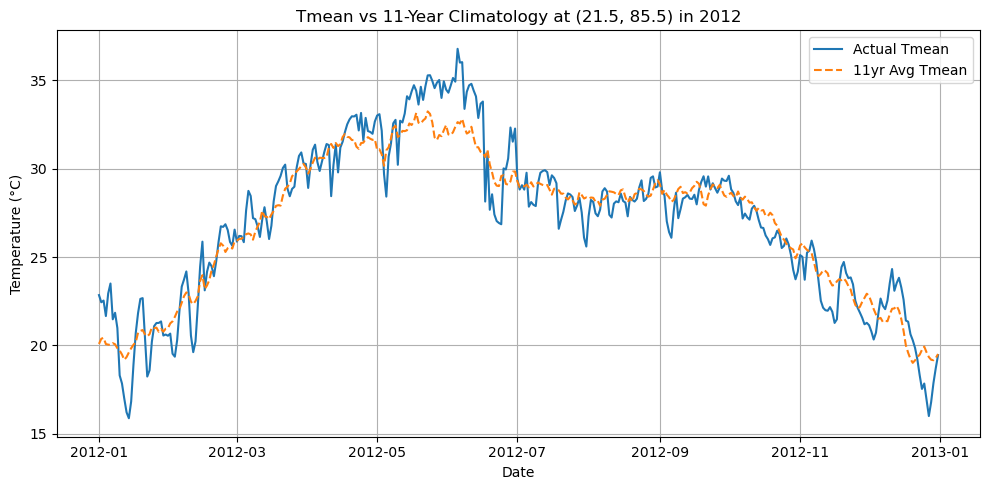

In [18]:
lat, lon = 21.5, 85.5
year = 2012

df_plot = df_merged[
    (df_merged['Latitude'] == lat) &
    (df_merged['Longitude'] == lon) &
    (df_merged['Date'].dt.year == year)
]

# Plot
plt.figure(figsize=(10, 5))
plt.plot(df_plot['Date'], df_plot['Tmean'], label='Actual Tmean')
plt.plot(df_plot['Date'], df_plot['Tmean_11yr_avg'], label='11yr Avg Tmean', linestyle='--')
plt.title(f'Tmean vs 11-Year Climatology at ({lat}, {lon}) in {year}')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

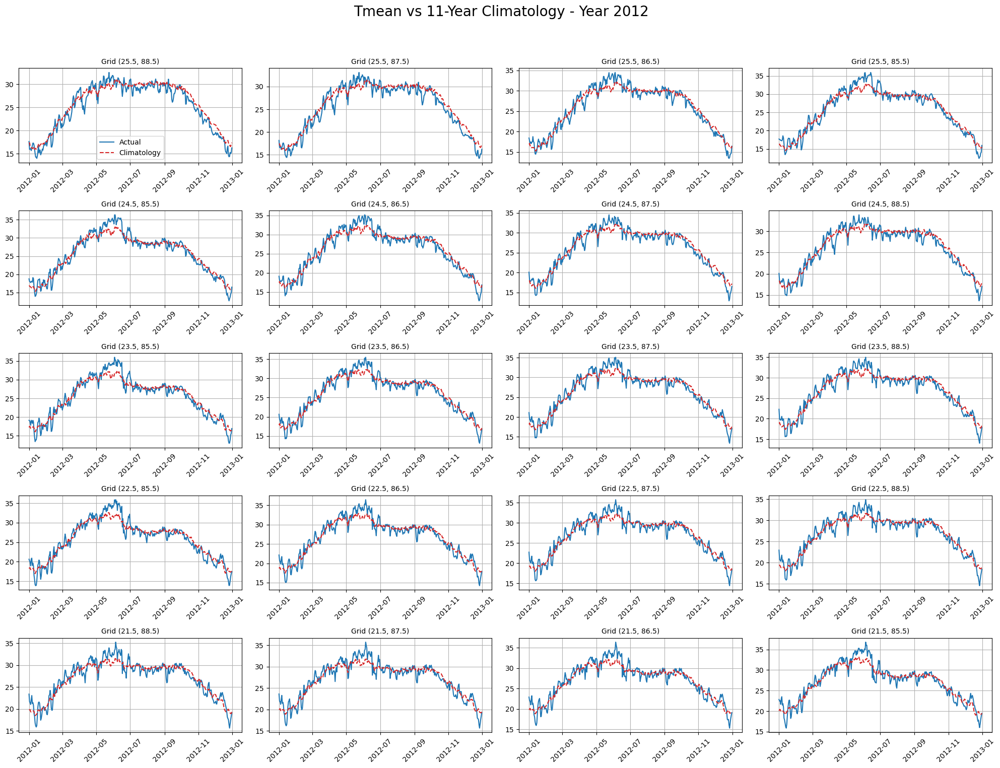

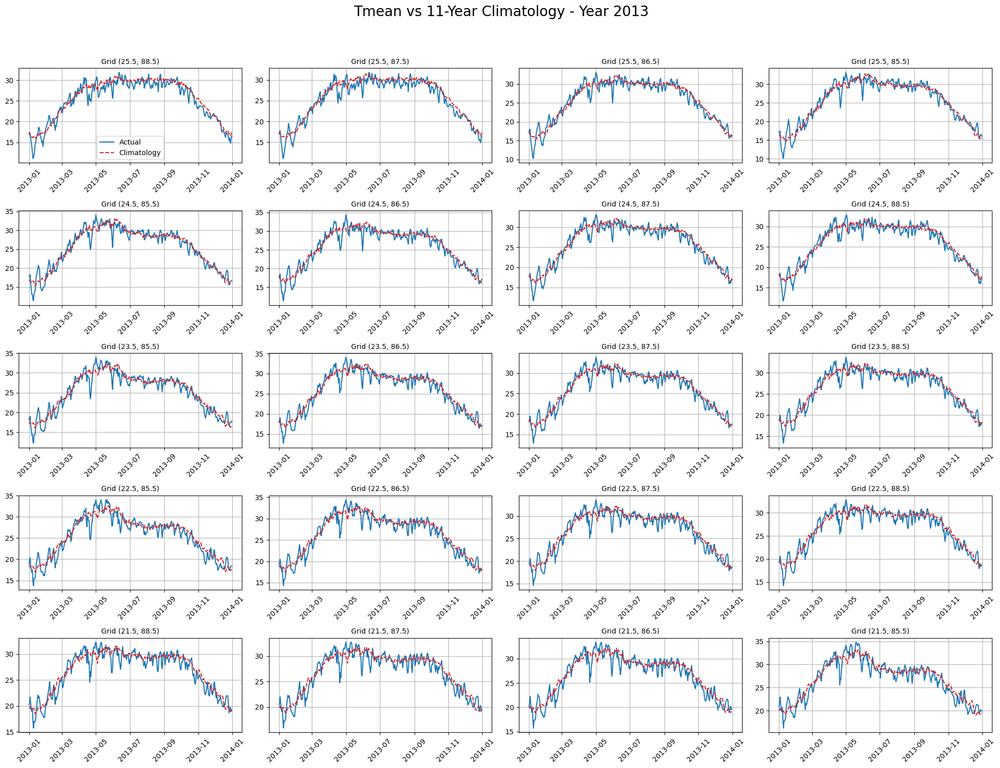

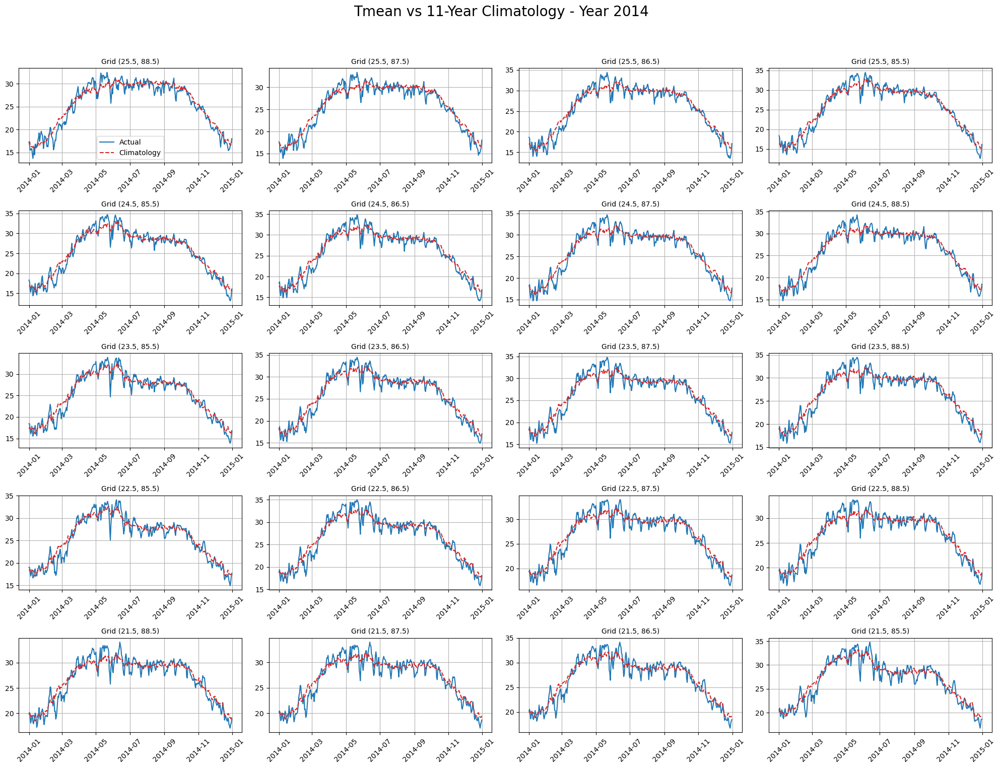

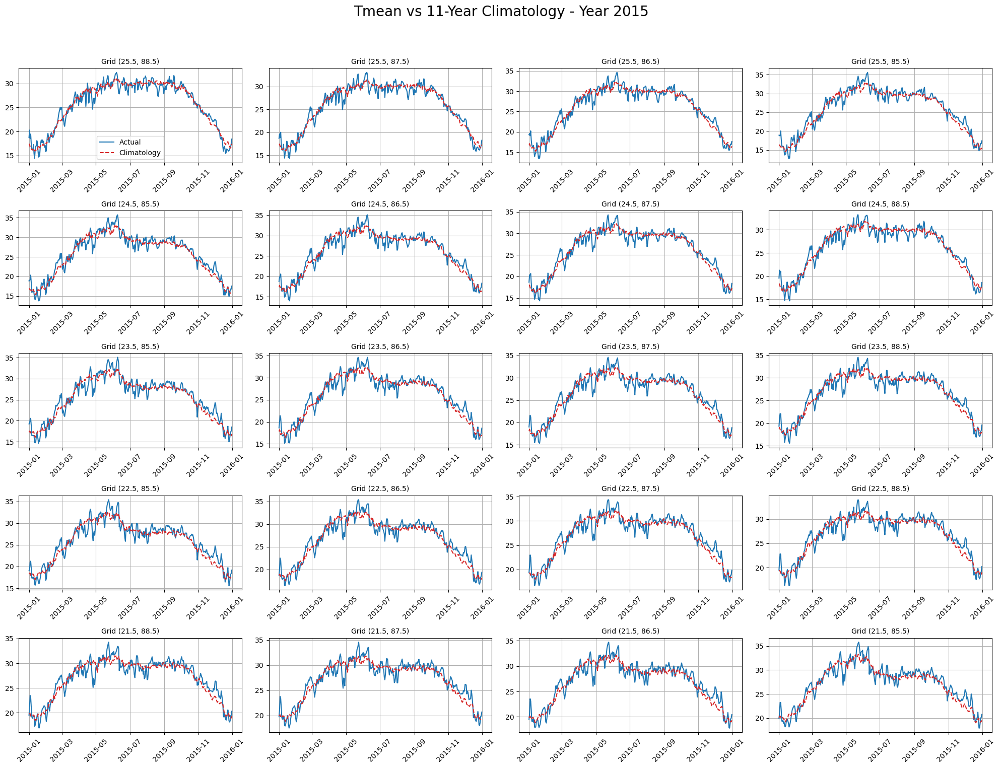

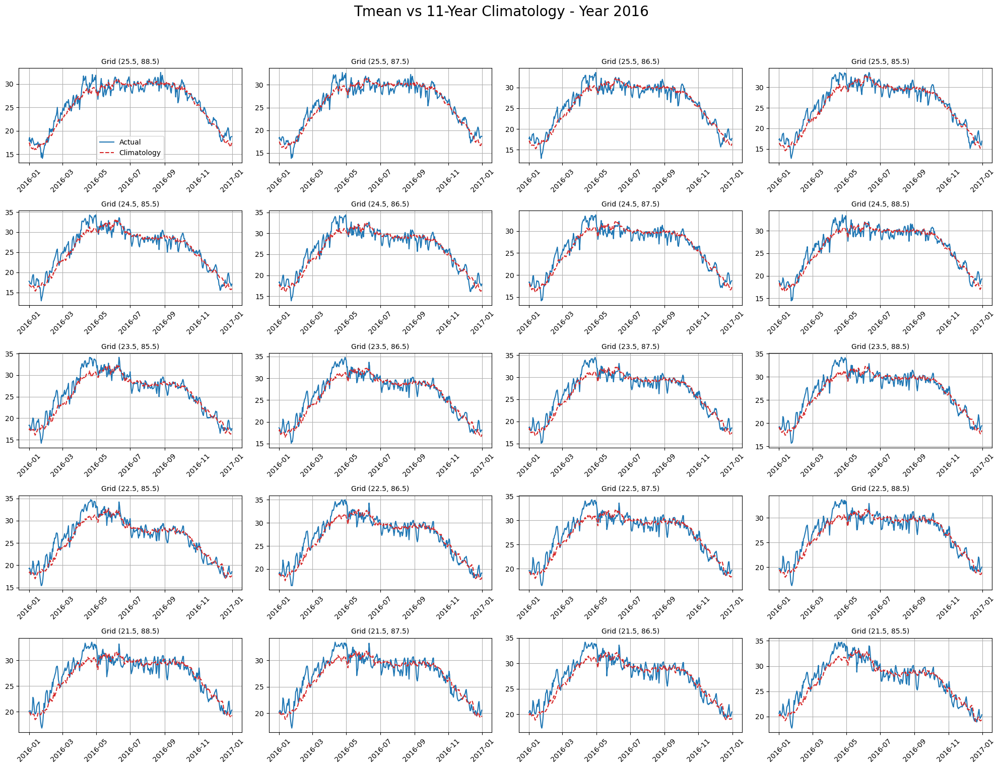

...

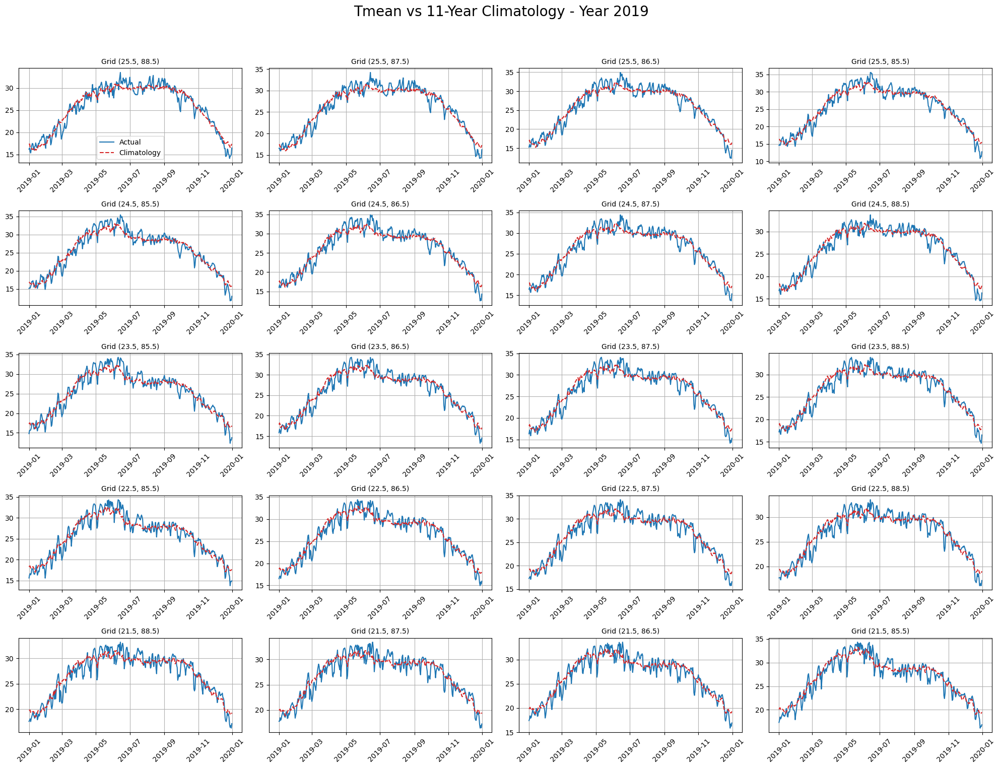

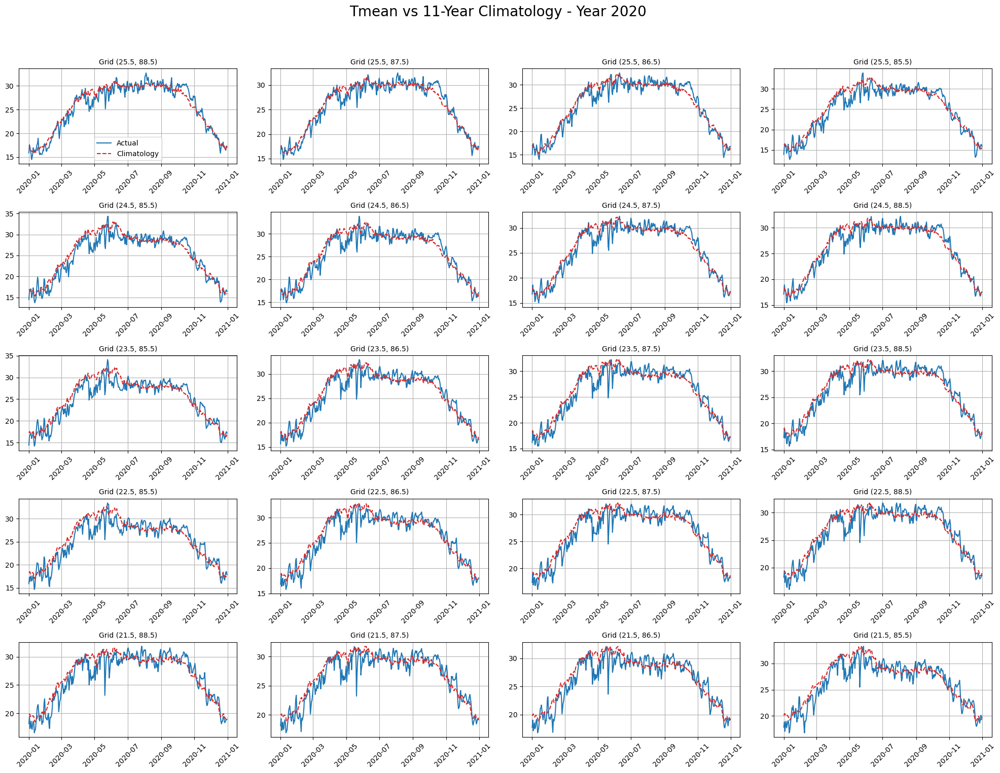

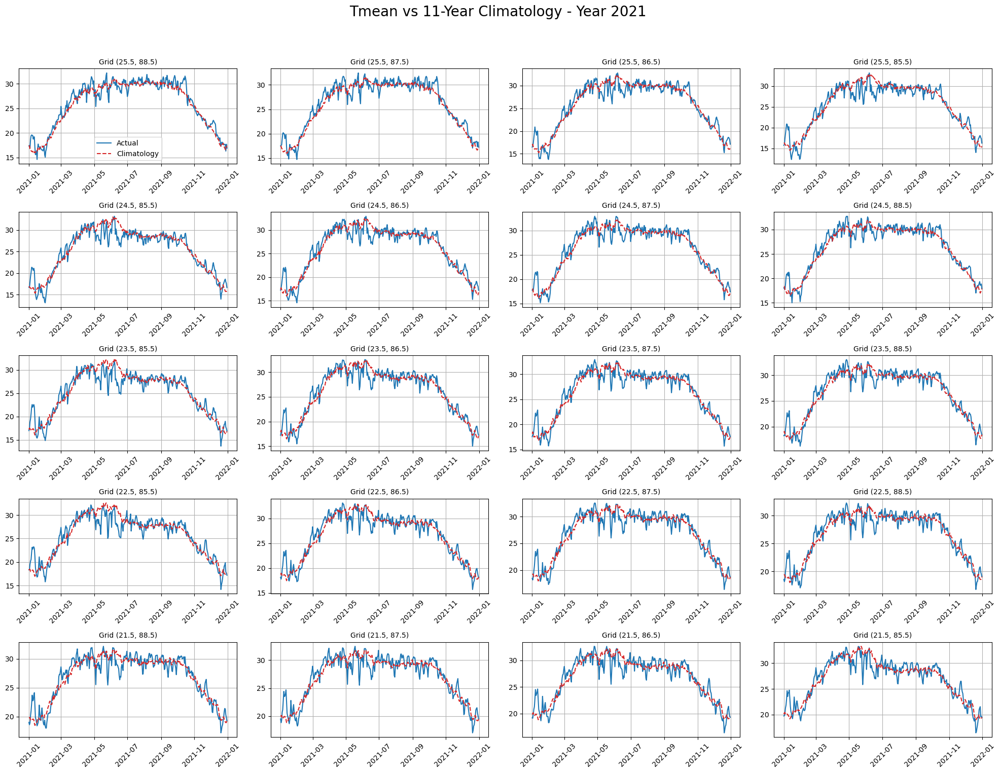

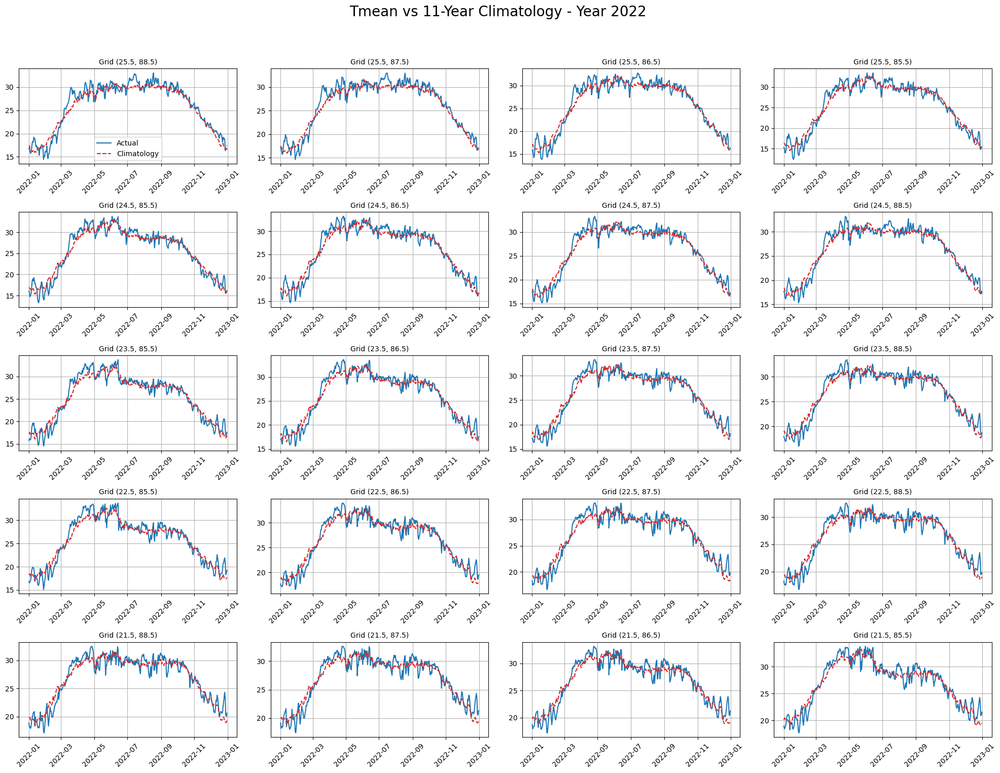

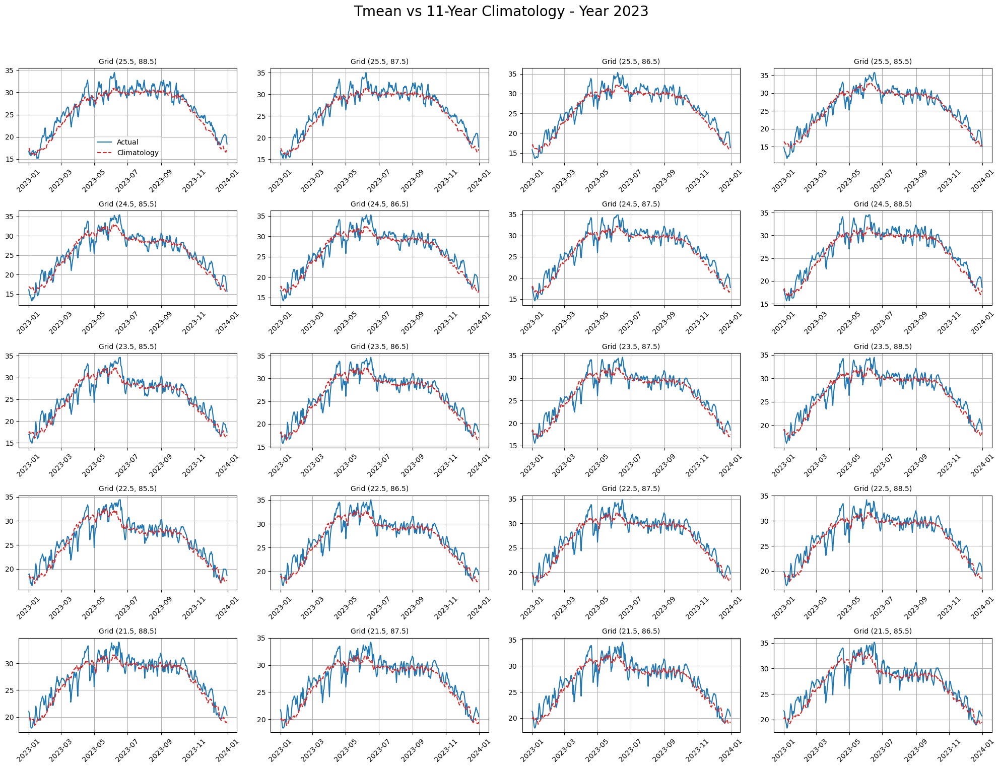

In [19]:
grid_points = df_merged[['Latitude', 'Longitude']].drop_duplicates().sort_values(by='Latitude', ascending=False).values
years = sorted(df_merged['Date'].dt.year.unique())

for year in years:
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))  # 5 rows, 4 columns
    fig.suptitle(f'Tmean vs 11-Year Climatology - Year {year}', fontsize=20)
    
    for i, (lat, lon) in enumerate(grid_points):
        ax = axs[i // 4, i % 4]
        
        df_plot = df_merged[
            (df_merged['Latitude'] == lat) &
            (df_merged['Longitude'] == lon) &
            (df_merged['Date'].dt.year == year)
        ]
        
        ax.plot(df_plot['Date'], df_plot['Tmean'], label='Actual', color='tab:blue')
        ax.plot(df_plot['Date'], df_plot['Tmean_11yr_avg'], label='Climatology', linestyle='--', color='tab:red')
        ax.set_title(f'Grid ({lat}, {lon})', fontsize=10)
        ax.tick_params(axis='x', labelrotation=45)
        ax.grid(True)

        if i == 0:
            ax.legend()

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [20]:
print(df_merged.head())

        Date  Latitude  Longitude   Tmax   Tmin  Rain   Tmean  Month  Day  \
0 2012-01-01      21.5       85.5  28.45  17.24   0.0  22.845      1    1   
1 2012-01-02      21.5       85.5  27.20  17.68   0.0  22.440      1    2   
2 2012-01-03      21.5       85.5  27.56  17.51   0.0  22.535      1    3   
3 2012-01-04      21.5       85.5  25.63  17.69   0.0  21.660      1    4   
4 2012-01-05      21.5       85.5  27.87  18.00   0.0  22.935      1    5   

   Tmean_11yr_avg Climatology_Date  
0       20.079762       2012-01-01  
1       20.375367       2012-01-02  
2       20.423900       2012-01-03  
3       20.075042       2012-01-04  
4       20.042537       2012-01-05  


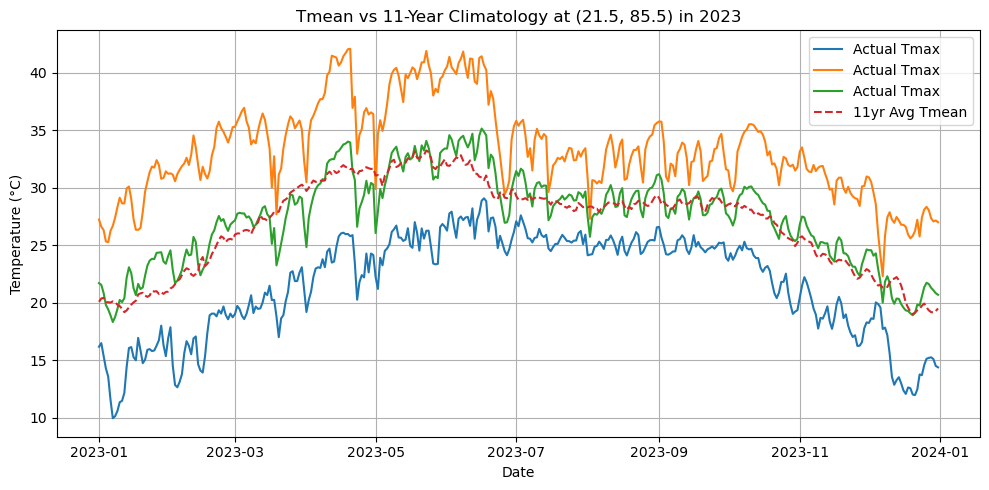

In [39]:
plt.figure(figsize=(10, 5))
plt.plot(df_plot['Date'], df_plot['Tmin'], label='Actual Tmax')
plt.plot(df_plot['Date'], df_plot['Tmax'], label='Actual Tmax')
plt.plot(df_plot['Date'], df_plot['Tmean'], label='Actual Tmax')
plt.plot(df_plot['Date'], df_plot['Tmean_11yr_avg'], label='11yr Avg Tmean', linestyle='--')
plt.title(f'Tmean vs 11-Year Climatology at ({lat}, {lon}) in {year}')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()